In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
matplotlib.get_backend()
import cv2
import glob
from moviepy.editor import VideoFileClip
%matplotlib inline

# Find the images and objectpoints and imagepoints for camera calibration

In [2]:
#Find the images in the folder
images = glob.glob('./camera_cal/*.jpg')
objpoints = [] #3D points in real world space
imgpoints = [] #2D points in image plane

# Prepare object points, like (0,0,0), (1,0,0), (2,0,0) ...., (7,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

for i, img in enumerate(images):
    img = cv2.imread(img)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)
    if ret == True:
        imgpoints.append(corners)
        objpoints.append(objp)	
        #Draw and display the corners:
        Dis = cv2.drawChessboardCorners(img, (9,6), corners, ret)

In [3]:
def un_dist(img, nx, ny, objpoints, imgpoints):
    img_size = (img.shape[1], img.shape[0])
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size, None, None)
    undst = cv2.undistort(img, mtx, dist, None, mtx)
    return undst, mtx, dist

def unwarp(img, src, dst):
    img_size = (img.shape[1], img.shape[0])
    #Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    #Warp the image using OpenCV warpPerspective()
    Unwarped = cv2.warpPerspective(img, M, img_size)
    return Unwarped, M, Minv

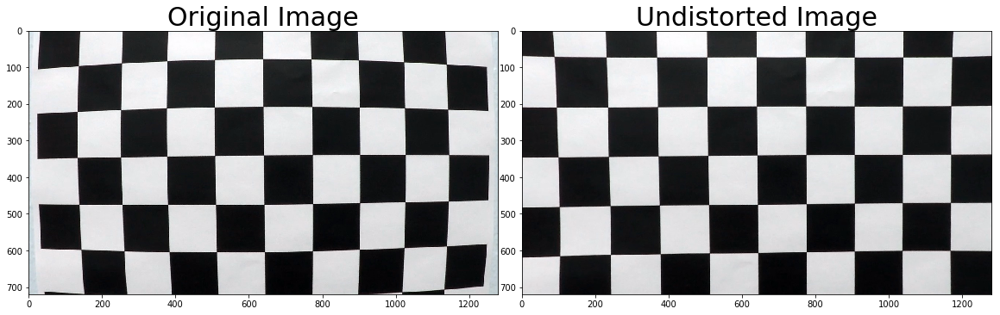

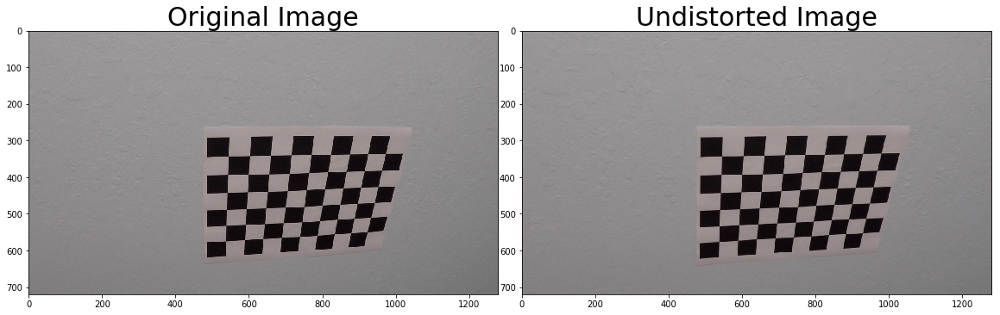

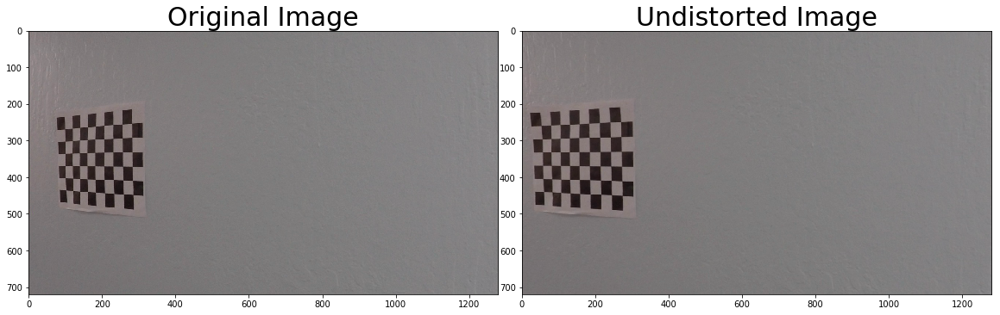

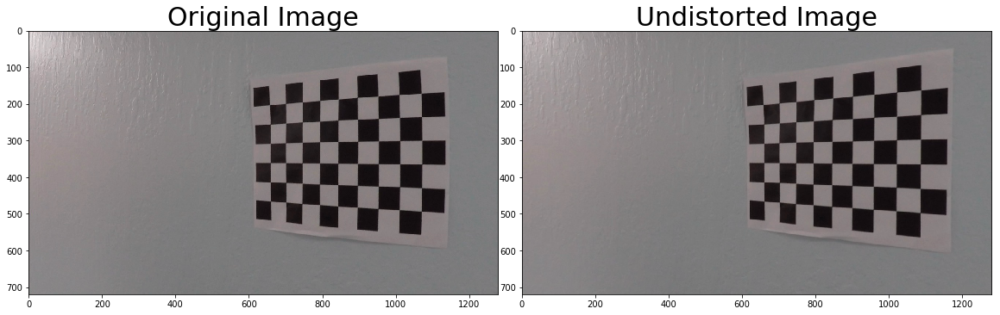

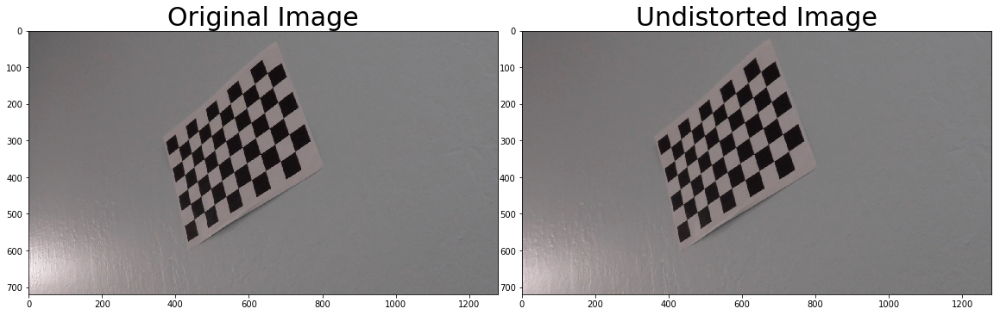

...

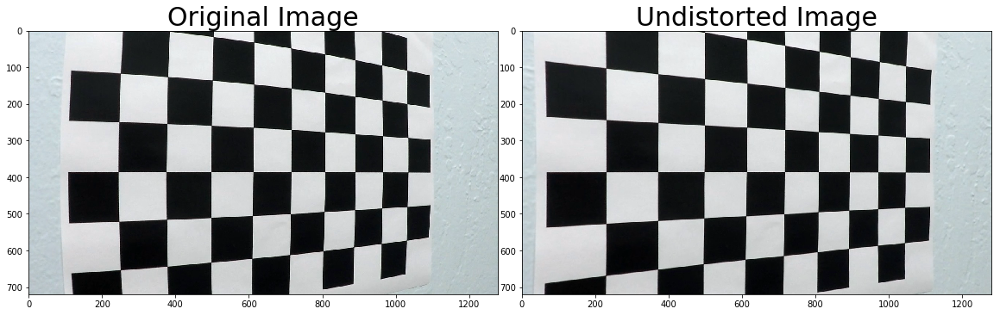

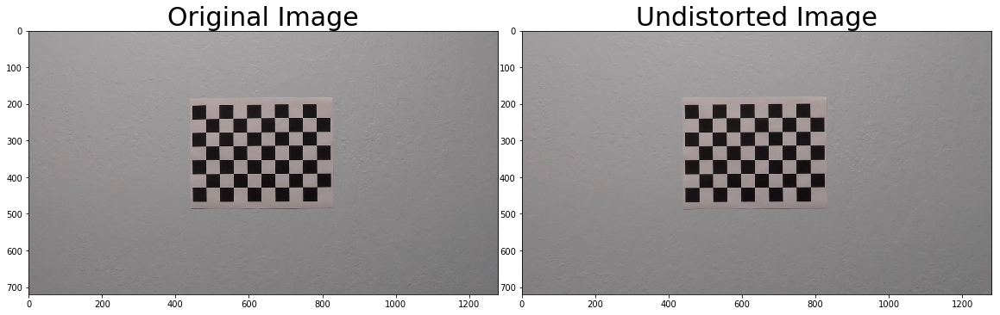

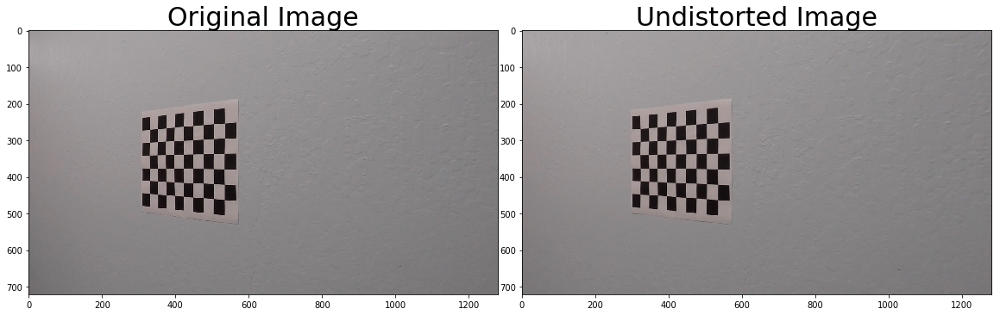

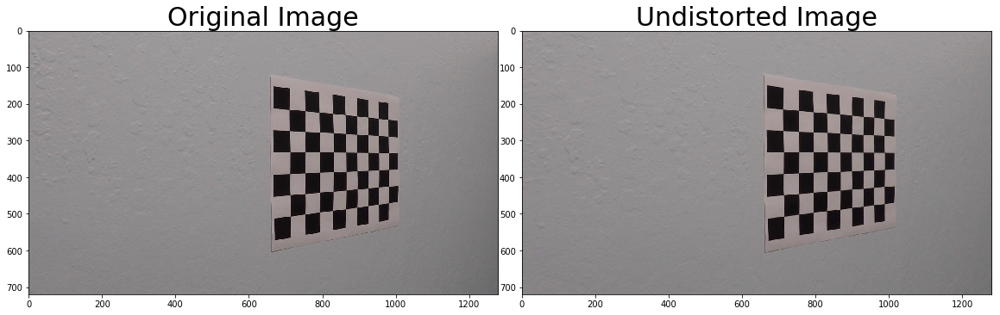

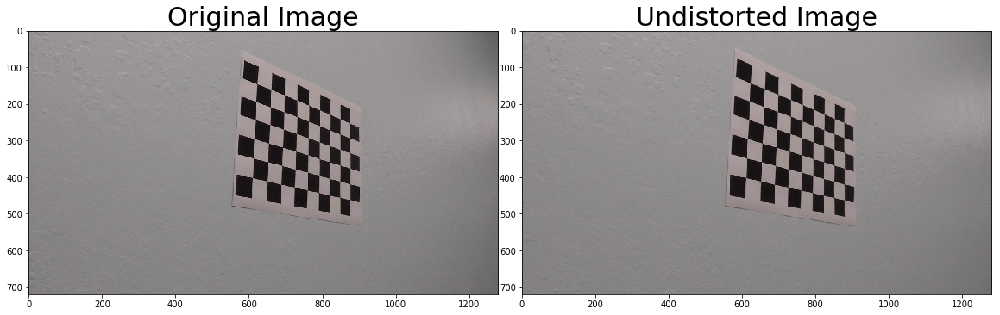

In [4]:
#Plot the undistorted images
for img in images:
    img = cv2.imread(img)
    undst, mtx, dist = un_dist(img, 9, 6, objpoints, imgpoints)
    #Save the caera calibration resut for later use
    dist_pickle = {}
    dist_pickle['mtx'] = mtx
    dist_pickle['dist'] = dist
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize = 30)
    ax2.imshow(undst)
    ax2.set_title('Undistorted Image', fontsize =30)

# Test the road image, convert it to undistorted and unwarped images

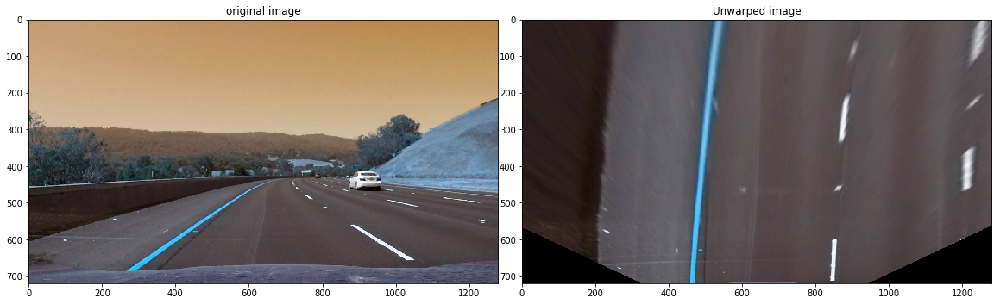

In [5]:
#Test on road image
example_img = cv2.imread('./test_images/test3.jpg')
#example_img = cv2.cvtColor(example_img, cv2.COLOR_BGR2GRAY)
undist_example_img = cv2.undistort(example_img, dist_pickle['mtx'], dist_pickle['dist'], None, dist_pickle['mtx'])
h, w = undist_example_img.shape[:2]
src = np.float32([(575, 464),(707, 464), (258, 682), (1049, 682)])
dst = np.float32([[450,0], [w-450, 0], [450, h], [w-450, h]])
Unwarp_img = unwarp(undist_example_img, src, dst)[0]
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace=0.2, wspace=0.05)
ax1.imshow(example_img)
ax1.set_title('original image')
ax2.imshow(Unwarp_img)
ax2.set_title('Unwarped image')

# Sobel Absolute Threshold, Magnitude of the Gradient, Direction of the Gradient

In [6]:
#Applying Sobel
def mag_thresh(gray, orient='x', sobel_kernel=3, mag_thresh=(0, 255)):
    # Apply x or y gradient
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute values
    sobel = np.absolute(sobel)
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*sobel/np.max(sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel > mag_thresh[0]) & (scaled_sobel < mag_thresh[1])] = 1
    # Return the result
    return binary_output

#
def dir_threshold(img, sobel_kernel, thresh):
    # Grayscale
    if len(img.shape) == 3:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    # Return the binary image
    return binary_output

def HLS(img, thresh):
    #Convert image to HLS space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    image_S = hls[:,:,2]
    binary = np.zeros_like(image_S)
    binary[(image_S > thresh[0]) & (image_S <= thresh[1])] = 1
    image_S_filter = binary
    return image_S_filter

def LAB(img, thresh):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    lab_b = lab[:,:,2]
    if np.max(lab_b) > 175:
        lab_b = lab_b*(255/np.max(lab_b))
    binary_output = np.zeros_like(lab_b)
    binary_output[((lab_b > thresh[0]) & (lab_b <= thresh[1]))] = 1
    return binary_output

image in S space with filter
gradx shape: (720, 1280)
mag_binary shape: (720, 1280)
dir_binary shape: (720, 1280)


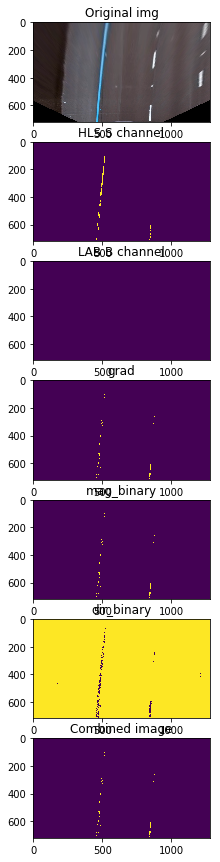

In [7]:
fig, axs = plt.subplots(7,1, figsize=(30,15))
f.tight_layout()
axs[0].imshow(Unwarp_img)
axs[0].set_title("Original img")

image_S_filter = HLS(Unwarp_img, (160, 225))
axs[1].imshow(image_S_filter)
axs[1].set_title("HLS S channel")
print ("image in S space with filter")

image_B_filter = LAB(Unwarp_img, (160, 225))
axs[2].imshow(image_B_filter)
axs[2].set_title("LAB B channel")
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements
grad = mag_thresh(image_S_filter, sobel_kernel=3, mag_thresh=(25, 255))
axs[3].imshow(grad)
axs[3].set_title("grad")
mag_binary = mag_thresh(image_S_filter, sobel_kernel=ksize, mag_thresh=(25, 255))
axs[4].imshow(mag_binary)
axs[4].set_title("mag_binary")
dir_binary = dir_threshold(image_S_filter, sobel_kernel=7, thresh=(0, 0.09))
axs[5].imshow(dir_binary)
axs[5].set_title("dir_binary")

print ("gradx shape:", grad.shape)
print ("mag_binary shape:", mag_binary.shape)
print ("dir_binary shape:", dir_binary.shape)

#Combining all thresholding functions
combined = np.zeros_like(dir_binary)
combined[(grad == 1) | ((mag_binary == 1) & (dir_binary == 1))] = 1

axs[6].imshow(combined)
axs[6].set_title("Combined image")

# Region of Interest

In [8]:
def Mask_region(img):
    
#     return masked_image
    ysize = img.shape[0]
    xsize = img.shape[1]
    region_select = np.copy(img)
    
#Define a triangle region of interest
    left_bottom = [100, ysize]
    right_bottom = [1400, ysize]
    apex_left = [500, 450]
    apex_right = [800, 450]
    
#np.polyfit() returns the coefficients [A,B] of the fit
    fit_left = np.polyfit((left_bottom[0], apex_left[0]), (left_bottom[1], apex_left[1]), 1)
    fit_right = np.polyfit((right_bottom[0], apex_right[0]), (right_bottom[1], apex_right[1]), 1)
    
#Find the region inside the lines:
    XX, YY = np.meshgrid(np.arange(0, xsize), np.arange(0, ysize))
    region_threshold = ((YY < (XX*fit_left[0] + fit_left[1])) + \
                        (YY < (XX*fit_right[0] + fit_right[1])))
    
#Color Pixels black which are outside the region of interest
    if len(img.shape) == 2:
        region_select[region_threshold] = 0
    else:
        region_select[region_threshold] = [0, 0, 0]
    
    masked_image = cv2.bitwise_and(img, region_select)
    
    return masked_image

# Run Pipeline on All Test Images

In [9]:
def Pipeline(img, ksize=7):    

    kernel_size = 5
    img = cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)
    # Convert to HLS color space and separate the S channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s = hls[:,:,2]
    # Grayscale image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # Define sobel kernel size
    ksize = 7
    # Apply each of the thresholding functions
    gradx = mag_thresh(gray, orient='x', sobel_kernel=ksize, mag_thresh=(10, 255))
    grady = mag_thresh(gray, orient='y', sobel_kernel=ksize, mag_thresh=(60, 255))
    grad = mag_thresh(gray, sobel_kernel=ksize, mag_thresh=(50, 225))
    mag_binary = mag_thresh(gray, sobel_kernel=ksize, mag_thresh=(40, 255))
    # Combine all the thresholding information
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1    
    # Threshold color channel
    s_binary = np.zeros_like(combined)
    s_binary[(s > 160) & (s < 255)] = 1    
    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors    
    color_binary = np.zeros_like(combined)
    color_binary[(s_binary > 0) | (combined > 0)] = 1    
#    color_binary = Mask_region(color_binary)
  
    #Undistort the image
    undst_img = cv2.undistort(color_binary, dist_pickle['mtx'], dist_pickle['dist'], None, dist_pickle['mtx']) #Undistort the image
    h, w = undst_img.shape[:2]
    src = np.float32([(575, 464),(707, 464), (258, 682), (1049, 682)])
    dst = np.float32([[450,0], [w-450, 0], [450, h], [w-450, h]])
    Unwarped, M, Minv = unwarp(undst_img, src, dst)
 
    return Unwarped, M, Minv, color_binary

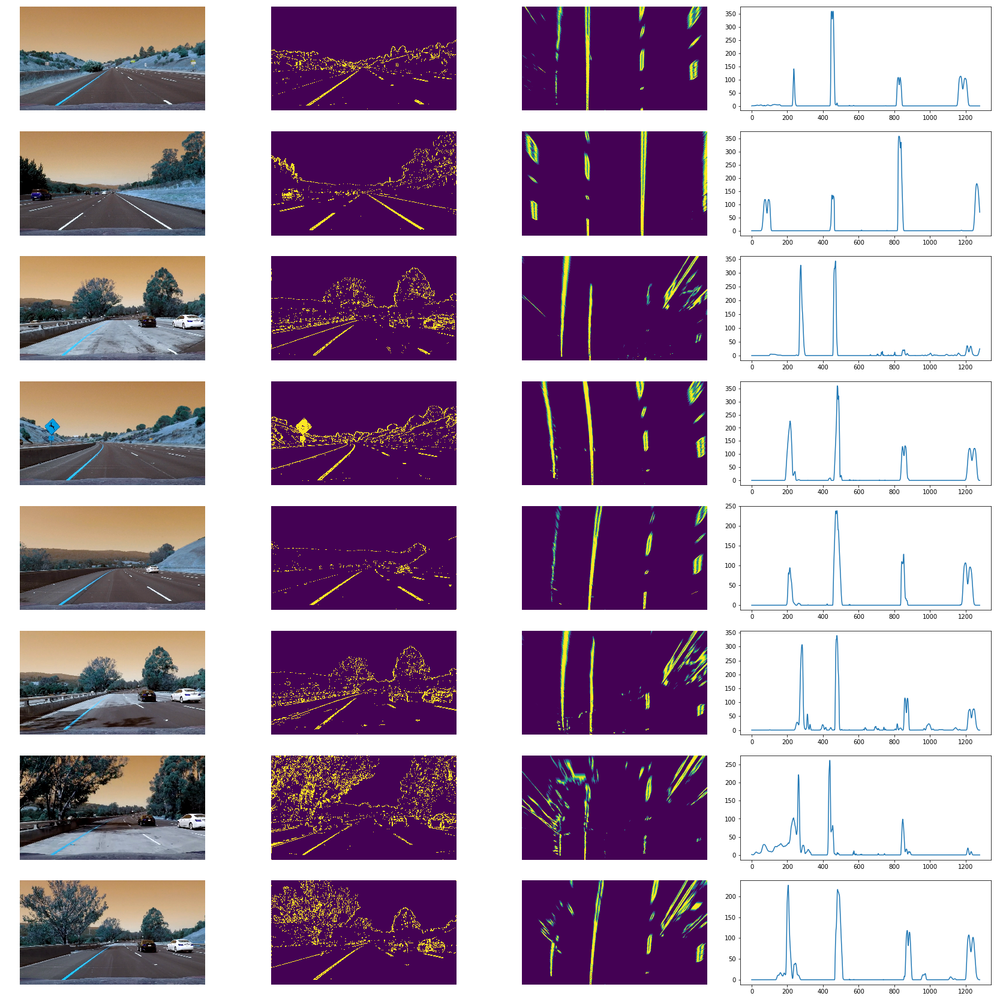

In [67]:
#Make a list of examples images
images = glob.glob('./test_images/*.jpg')

#Set up plot
fig, axs = plt.subplots(len(images), 4, figsize = (30,30))
fig.subplots_adjust(hspace = 0.2, wspace = 0.001)
axs = axs.ravel()

i = 0
for img in images:
    img = cv2.imread(img)
    Unwarped, M, Minv, img_masked = Pipeline(img, 3)
    axs[i].imshow(img)
    axs[i].axis('off')
    i=i+1
    axs[i].imshow(img_masked) 
    axs[i].axis('off')
    i=i+1
    axs[i].imshow(Unwarped)
    axs[i].axis('off')
    i=i+1
    histogram = np.sum(Unwarped[Unwarped.shape[0]//2:,:], axis=0)
    axs[i].plot(histogram)
    i=i+1

# Implement Sliding Windows and Fit a Polynomial
Now we need to implement sliding windows to fit a polynomial to the Lane

In [11]:
def first_Poly_fit(img):
    import numpy as np
    import cv2
    import matplotlib.pyplot as plt
    #Convert the img to grayscale
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    #Run the picture through Pipeline
    binary_warped = Pipeline(img, 3)[0]
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    # These will be the starting point for the left and right lines
    quarter_point = np.int(midpoint//2)
    leftx_base = np.argmax(histogram[quarter_point:midpoint]) + quarter_point
    rightx_base = np.argmax(histogram[midpoint:(midpoint+quarter_point)]) + midpoint

    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
        (0,255,0), 2)
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
        (0,255,0), 2) 
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    if leftx.size != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    else:
        left_fit = None
    
    if rightx.size != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    else:
        right_fit = None
    
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
#     left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
#     right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return binary_warped, ploty, left_fit, right_fit, left_lane_inds, right_lane_inds, out_img, nonzeroy, nonzerox

# Visualization
At this point, you're done! But here is how you can visualize the result as well:

(720, 0)

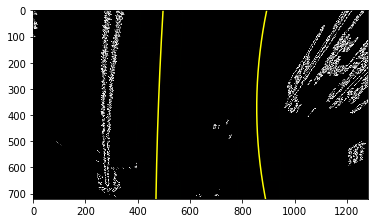

In [13]:
# Generate x and y values for plotting
img = cv2.imread('./test_images/test4.jpg')
binary_warped, ploty, left_fit, right_fit, left_lane_inds, right_lane_inds, out_img, nonzeroy, nonzerox = first_Poly_fit(img)
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
plt.imshow(out_img)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

# Skip the sliding windows step once you know where the lines are
Now you know where the lines are you have a fit! In the next frame of video you don't need to do a blind search again, but instead you can just search in a margin around the previous line position like this:

In [14]:
def polyfit_pre(binary_warped, left_fit_prev, right_fit_prev):
    binary_warped = Pipeline(img)[0]
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 100
    left_lane_inds = ((nonzerox > (left_fit_prev[0]*(nonzeroy**2) + left_fit_prev[1]*nonzeroy + 
    left_fit_prev[2] - margin)) & (nonzerox < (left_fit_prev[0]*(nonzeroy**2) + 
    left_fit_prev[1]*nonzeroy + left_fit_prev[2] + margin))) 

    right_lane_inds = ((nonzerox > (right_fit_prev[0]*(nonzeroy**2) + right_fit_prev[1]*nonzeroy + 
    right_fit_prev[2] - margin)) & (nonzerox < (right_fit_prev[0]*(nonzeroy**2) + 
    right_fit_prev[1]*nonzeroy + right_fit_prev[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
#     left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
#     right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    return left_fit, right_fit, left_lane_inds, right_lane_inds, ploty
    
left_fit_new, right_fit_new, left_lane_inds_new, right_lane_inds_new, ploty = polyfit_pre(img, left_fit, right_fit)

# And you're done! But let's visualize the result here as well

(720, 0)

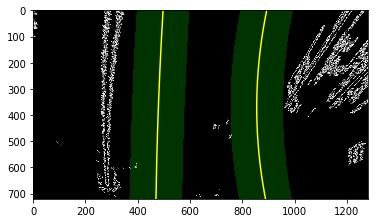

In [24]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
#Margin
margin = 100
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                              ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                              ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

# Calculate the Radius in Real world

In [25]:
def Find_Curvature(left_fit, right_fit, y):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    ymal = np.max(y)
    left_Rad = ((1 + (2*left_fit[0]*ymal*ym_per_pix + left_fit[1])**2)**(3.0/2))/(2*np.absolute(left_fit[0]))
    return left_Rad

# Find the position of the car from the center

In [38]:
def find_position(img, left_fit, right_fit):
    # Find the position of the car from the center
    
    # Define conversions in x and y from pixels space to meters
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension    
    car_position = img.shape[1]/2
    
    l_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
    r_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
    lane_center_position = (r_fit_x_int + l_fit_x_int) /2
    center_dist = (car_position - lane_center_position) * xm_per_pix
    return center_dist 

# Draw the lines back to original pictures

In [61]:
def draw_lines(warped, undist, Minv, ploty, left_fitx, right_fitx, curvature, left_fit, right_fit):
    # Create an image to draw the lines on
    image = undist
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    #Put text for curvature on the image
    font = cv2.FONT_HERSHEY_SIMPLEX
    text_Curv = "Radius of Curvature:{} m".format(float(curvature))
    result = cv2.putText(result,text_Curv,(400,100), font, 1,(255,255,255),2)
    
    #Put text for center on the image
    position = find_position(img, left_fit, right_fit)
    text_Dist = "Distance to Center:{} m".format(float(position))
    result = cv2.putText(result,text_Dist,(400,200), font, 1,(255,255,255),2)
    
    return result

# Define a Line Class for Storing Data

In [62]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        #self.current_fit = [np.array([False])]  
        self.current_fit = [] 
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #Record the pervious raduis of the curavture
        self.pre_radius_of_curvature = None
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None
        
    def add_fit(self, fit, inds, ploty):
        ym_per_pix = 30/720 # meters per pixel in y dimension
        xm_per_pix = 3.7/700 # meters per pixel in x dimension
        ymal = np.max(ploty)
        if fit is not None:
            #if we have a best fit, see how this new fit compares
            if self.best_fit is not None:
                self.diffs = abs(fit - self.best_fit)
                if (self.diffs[0] > 0.001 or self.diffs[1] > 1.0 or self.diffs[2] > 100.) and len(self.current_fit) > 0:
                    self.detected = False
                else:
                    self.detected = True
                    self.current_fit.append(fit)
                    if len(self.current_fit) > 5:
                        #Throw out old fits, keep newest n
                        self.current_fit = self.current_fit[len(self.current_fit)-3:]
                        print ("Find fit, average previous curves, curves > 5")
                    self.best_fit = np.average(self.current_fit, axis=0)
                    # Define conversions in x and y from pixels space to meters
                    self.radius_of_curvature = ((1 + (2*self.best_fit[0]*ymal*ym_per_pix + self.best_fit[1])**2)**(3.0/2))/(2*np.absolute(self.best_fit[0]))
            else:
                self.detected = True
                self.current_fit.append(fit)
                self.best_fit = np.average(self.current_fit, axis=0)
                self.radius_of_curvature = ((1 + (2*self.best_fit[0]*ymal*ym_per_pix + self.best_fit[1])**2)**(3.0/2))/(2*np.absolute(self.best_fit[0]))
            
        else:
            self.detected == False
            if len(self.current_fit) > 0:
                if len(self.current_fit) > 5:
                    self.current_fit = self.current_fit[len(self.current_fit)-3:]
                    self.best_fit = np.average(self.current_fit, axis=0)
                    self.radius_of_curvature = ((1 + (2*self.best_fit[0]*ymal*ym_per_pix + self.best_fit[1])**2)**(3.0/2))/(2*np.absolute(self.best_fit[0]))
                elif len(self.current_fit) == 1:
                    self.best_fit = np.average(self.current_fit, axis=0)
                    self.radius_of_curvature = ((1 + (2*self.best_fit[0]*ymal*ym_per_pix + self.best_fit[1])**2)**(3.0/2))/(2*np.absolute(self.best_fit[0]))

# Check if the two lines are parallel or not

In [63]:
def check_parallel(left_fit, right_fit):
    diffs = abs(left_fit - right_fit)
    if (diffs[0] > 0.0015 or diffs[1] > 1.0):
        return False
    else:
        return True

# Define Complete Image Processing Pipeline

In [64]:
def process_image(img):
    image_S_filter, M, Minv, imge_masked = Pipeline(img, ksize=5)
    
    #Calculate the fit data:
    binary_warped, ploty, left_fit, right_fit, left_lane_inds, right_lane_inds, out_img, nonzeroy, nonzerox = first_Poly_fit(img)
    
    #invalidate both fits if the difference in their x-intercepts aren't around 350 px (+/- 100px)
    if left_fit is not None and right_fit is not None:
        #calculate the x -intercept (bottom of image, x=image_height) for fits
        h = img.shape[0]
        l_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
        r_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
        x_int_diff = abs(r_fit_x_int-l_fit_x_int)
        if abs(350 - x_int_diff) > 100:
            left_fit = None
            right_fit = None
            print ("too far away")
        # Check parallel
        if left_fit is not None and right_fit is not None:
            parallel = check_parallel(left_fit, right_fit)
            if not parallel:
                right_fit = None
                left_fit = None
                print ("Two lanes are not parallel")

    # Append the detected line and do sanity check
    l_line.add_fit(left_fit, left_lane_inds, ploty)
    r_line.add_fit(right_fit, right_lane_inds, ploty)
    
    #Create x for Left & right fit and draw the lines
    left_fitx = l_line.best_fit[0]*ploty**2 + l_line.best_fit[1]*ploty + l_line.best_fit[2]
    right_fitx = r_line.best_fit[0]*ploty**2 + r_line.best_fit[1]*ploty + r_line.best_fit[2]
    result = draw_lines(image_S_filter, img, Minv, ploty, left_fitx, right_fitx, l_line.radius_of_curvature, l_line.best_fit, r_line.best_fit)
        
    
    return result


# Test Images

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5
too far away


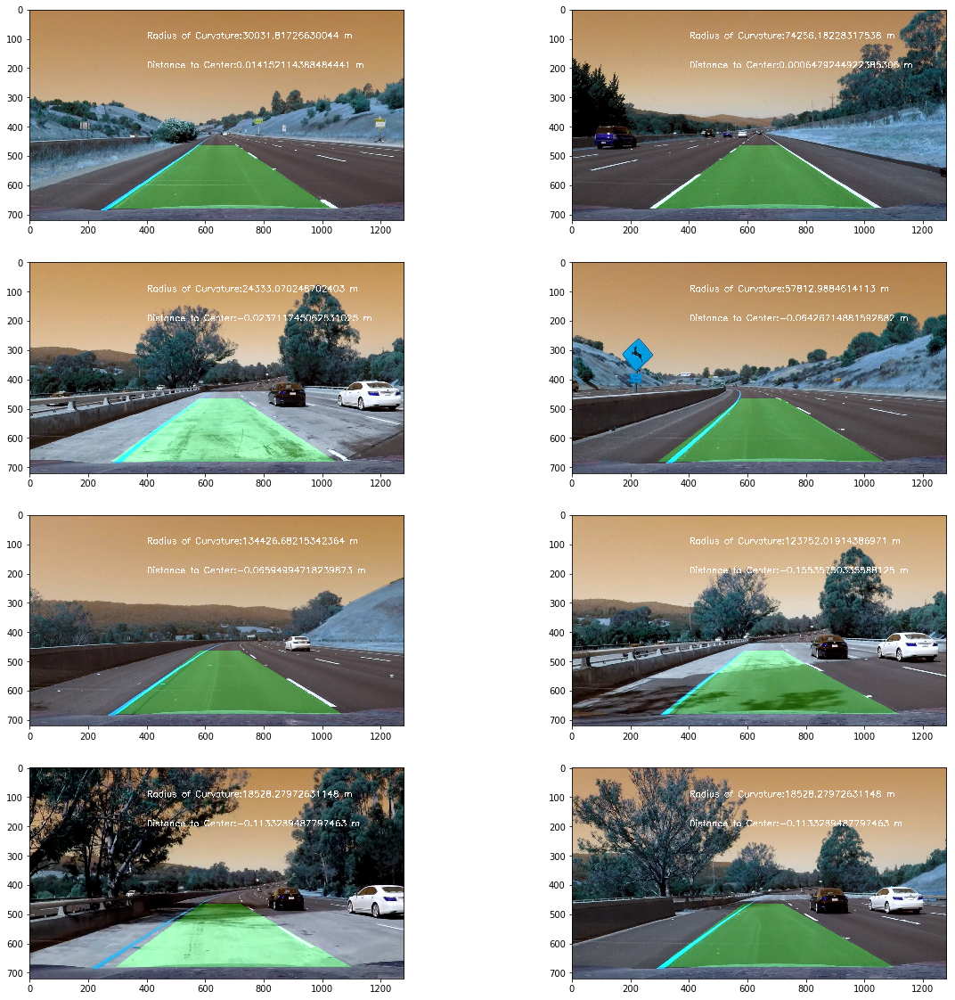

In [65]:
l_line = Line()
r_line = Line()
images = glob.glob('./test_images/*.jpg')

fig = plt.figure(figsize=(20,20))
columns = 2
rows = 4

for i, img in enumerate(images):
    img = cv2.imread(img)
    fig.add_subplot(rows, columns, i+1)
    result = process_image(img)
    plt.imshow(result)

In [66]:
l_line = Line()
r_line = Line()
#my_clip.write_gif('test.gif', fps=12)
video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')#.subclip(22,26)
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


  0%|▏                                        | 4/1261 [00:03<18:17,  1.14it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  1%|▏                                        | 7/1261 [00:06<18:26,  1.13it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  1%|▎                                       | 10/1261 [00:08<18:43,  1.11it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  1%|▍                                       | 13/1261 [00:12<19:42,  1.06it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  1%|▌                                       | 16/1261 [00:14<19:20,  1.07it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  2%|▌                                       | 19/1261 [00:17<19:16,  1.07it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  2%|▋                                       | 22/1261 [00:20<19:12,  1.07it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  2%|▊                                       | 25/1261 [00:23<18:57,  1.09it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  2%|▉                                       | 28/1261 [00:25<18:46,  1.09it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  2%|▉                                       | 31/1261 [00:28<18:40,  1.10it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  3%|█                                       | 34/1261 [00:30<18:28,  1.11it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  3%|█▏                                      | 37/1261 [00:33<18:31,  1.10it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  3%|█▎                                      | 40/1261 [00:35<18:13,  1.12it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  3%|█▎                                      | 43/1261 [00:38<18:00,  1.13it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  4%|█▍                                      | 46/1261 [00:40<17:51,  1.13it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  4%|█▌                                      | 49/1261 [00:42<17:33,  1.15it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  4%|█▋                                      | 52/1261 [00:45<17:27,  1.15it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  4%|█▋                                      | 55/1261 [00:47<17:17,  1.16it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  5%|█▊                                      | 58/1261 [00:49<17:09,  1.17it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  5%|█▉                                      | 61/1261 [00:51<16:54,  1.18it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  5%|██                                      | 64/1261 [00:53<16:42,  1.19it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  5%|██▏                                     | 67/1261 [00:55<16:31,  1.20it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  6%|██▏                                     | 70/1261 [00:57<16:26,  1.21it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  6%|██▎                                     | 73/1261 [01:00<16:23,  1.21it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  6%|██▍                                     | 76/1261 [01:02<16:13,  1.22it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  6%|██▌                                     | 79/1261 [01:04<16:02,  1.23it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  7%|██▌                                     | 82/1261 [01:06<16:00,  1.23it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  7%|██▋                                     | 85/1261 [01:08<15:52,  1.24it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  7%|██▊                                     | 88/1261 [01:11<15:48,  1.24it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  7%|██▉                                     | 91/1261 [01:13<15:47,  1.24it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  7%|██▉                                     | 94/1261 [01:16<15:45,  1.23it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  8%|███                                     | 97/1261 [01:19<15:50,  1.22it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  8%|███                                    | 100/1261 [01:21<15:49,  1.22it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  8%|███▏                                   | 103/1261 [01:24<15:45,  1.22it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  8%|███▎                                   | 106/1261 [01:26<15:42,  1.23it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  9%|███▎                                   | 109/1261 [01:28<15:39,  1.23it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  9%|███▍                                   | 112/1261 [01:31<15:34,  1.23it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  9%|███▌                                   | 115/1261 [01:33<15:35,  1.23it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


  9%|███▋                                   | 118/1261 [01:36<15:30,  1.23it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 10%|███▋                                   | 121/1261 [01:38<15:26,  1.23it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 10%|███▊                                   | 124/1261 [01:40<15:22,  1.23it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 10%|███▉                                   | 127/1261 [01:43<15:19,  1.23it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 10%|████                                   | 130/1261 [01:45<15:13,  1.24it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 11%|████                                   | 133/1261 [01:47<15:14,  1.23it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 11%|████▏                                  | 136/1261 [01:50<15:15,  1.23it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 11%|████▎                                  | 139/1261 [01:53<15:17,  1.22it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 11%|████▍                                  | 142/1261 [01:56<15:17,  1.22it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 11%|████▍                                  | 145/1261 [01:59<15:20,  1.21it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 12%|████▌                                  | 148/1261 [02:03<15:25,  1.20it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 12%|████▋                                  | 151/1261 [02:06<15:28,  1.20it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 12%|████▊                                  | 154/1261 [02:09<15:30,  1.19it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 12%|████▊                                  | 157/1261 [02:11<15:26,  1.19it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 13%|████▉                                  | 160/1261 [02:13<15:21,  1.19it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 13%|█████                                  | 163/1261 [02:16<15:17,  1.20it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 13%|█████▏                                 | 166/1261 [02:18<15:14,  1.20it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 13%|█████▏                                 | 169/1261 [02:20<15:10,  1.20it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 14%|█████▎                                 | 172/1261 [02:22<15:04,  1.20it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 14%|█████▍                                 | 175/1261 [02:24<14:59,  1.21it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 14%|█████▌                                 | 178/1261 [02:26<14:53,  1.21it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 14%|█████▌                                 | 181/1261 [02:28<14:48,  1.22it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 15%|█████▋                                 | 184/1261 [02:30<14:42,  1.22it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 15%|█████▊                                 | 187/1261 [02:32<14:37,  1.22it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 15%|█████▉                                 | 190/1261 [02:34<14:32,  1.23it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 15%|█████▉                                 | 193/1261 [02:36<14:27,  1.23it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 16%|██████                                 | 196/1261 [02:38<14:22,  1.23it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 16%|██████▏                                | 199/1261 [02:41<14:19,  1.24it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 16%|██████▏                                | 202/1261 [02:42<14:14,  1.24it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 16%|██████▎                                | 205/1261 [02:45<14:10,  1.24it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 16%|██████▍                                | 208/1261 [02:47<14:09,  1.24it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 17%|██████▌                                | 211/1261 [02:50<14:07,  1.24it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 17%|██████▌                                | 214/1261 [02:52<14:03,  1.24it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 17%|██████▋                                | 217/1261 [02:54<14:00,  1.24it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 17%|██████▊                                | 220/1261 [02:57<13:57,  1.24it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 18%|██████▉                                | 223/1261 [02:59<13:53,  1.24it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 18%|██████▉                                | 226/1261 [03:01<13:51,  1.24it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 18%|███████                                | 229/1261 [03:03<13:49,  1.24it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 18%|███████▏                               | 232/1261 [03:06<13:45,  1.25it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 19%|███████▎                               | 235/1261 [03:08<13:43,  1.25it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 19%|███████▎                               | 238/1261 [03:10<13:39,  1.25it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 19%|███████▍                               | 241/1261 [03:12<13:35,  1.25it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 19%|███████▌                               | 244/1261 [03:15<13:32,  1.25it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 20%|███████▋                               | 247/1261 [03:17<13:29,  1.25it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 20%|███████▋                               | 250/1261 [03:19<13:26,  1.25it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 20%|███████▊                               | 253/1261 [03:21<13:23,  1.26it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 20%|███████▉                               | 256/1261 [03:23<13:19,  1.26it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 21%|████████                               | 259/1261 [03:25<13:16,  1.26it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 21%|████████                               | 262/1261 [03:27<13:12,  1.26it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 21%|████████▏                              | 265/1261 [03:30<13:09,  1.26it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 21%|████████▎                              | 268/1261 [03:32<13:06,  1.26it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 21%|████████▍                              | 271/1261 [03:34<13:03,  1.26it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 22%|████████▍                              | 274/1261 [03:36<13:00,  1.26it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 22%|████████▌                              | 277/1261 [03:38<12:57,  1.27it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 22%|████████▋                              | 280/1261 [03:40<12:53,  1.27it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 22%|████████▊                              | 283/1261 [03:42<12:49,  1.27it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 23%|████████▊                              | 286/1261 [03:45<12:47,  1.27it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 23%|████████▉                              | 289/1261 [03:48<12:47,  1.27it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 23%|█████████                              | 292/1261 [03:50<12:44,  1.27it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 23%|█████████                              | 295/1261 [03:52<12:41,  1.27it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 24%|█████████▏                             | 298/1261 [03:54<12:37,  1.27it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 24%|█████████▎                             | 301/1261 [03:56<12:34,  1.27it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 24%|█████████▍                             | 304/1261 [03:58<12:30,  1.27it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 24%|█████████▍                             | 307/1261 [04:00<12:27,  1.28it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 25%|█████████▌                             | 310/1261 [04:02<12:24,  1.28it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 25%|█████████▋                             | 313/1261 [04:04<12:20,  1.28it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 25%|█████████▊                             | 316/1261 [04:06<12:16,  1.28it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 25%|█████████▊                             | 319/1261 [04:08<12:13,  1.28it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 26%|█████████▉                             | 322/1261 [04:10<12:09,  1.29it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 26%|██████████                             | 325/1261 [04:12<12:06,  1.29it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 26%|██████████▏                            | 328/1261 [04:14<12:03,  1.29it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 26%|██████████▏                            | 331/1261 [04:16<12:00,  1.29it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 26%|██████████▎                            | 334/1261 [04:18<11:57,  1.29it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 27%|██████████▍                            | 337/1261 [04:20<11:54,  1.29it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 27%|██████████▌                            | 340/1261 [04:22<11:51,  1.30it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 27%|██████████▌                            | 343/1261 [04:24<11:47,  1.30it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 27%|██████████▋                            | 346/1261 [04:26<11:44,  1.30it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 28%|██████████▊                            | 349/1261 [04:28<11:40,  1.30it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 28%|██████████▉                            | 352/1261 [04:30<11:37,  1.30it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 28%|██████████▉                            | 355/1261 [04:31<11:33,  1.31it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 28%|███████████                            | 358/1261 [04:33<11:30,  1.31it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 29%|███████████▏                           | 361/1261 [04:35<11:27,  1.31it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 29%|███████████▎                           | 364/1261 [04:37<11:24,  1.31it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 29%|███████████▎                           | 367/1261 [04:39<11:21,  1.31it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 29%|███████████▍                           | 370/1261 [04:41<11:17,  1.31it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 30%|███████████▌                           | 373/1261 [04:43<11:14,  1.32it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 30%|███████████▋                           | 376/1261 [04:45<11:12,  1.32it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 30%|███████████▋                           | 379/1261 [04:47<11:09,  1.32it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 30%|███████████▊                           | 382/1261 [04:49<11:06,  1.32it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 31%|███████████▉                           | 385/1261 [04:51<11:04,  1.32it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 31%|████████████                           | 388/1261 [04:53<11:01,  1.32it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 31%|████████████                           | 391/1261 [04:56<10:58,  1.32it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 31%|████████████▏                          | 394/1261 [04:58<10:56,  1.32it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 31%|████████████▎                          | 397/1261 [05:00<10:53,  1.32it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 32%|████████████▎                          | 400/1261 [05:02<10:50,  1.32it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 32%|████████████▍                          | 403/1261 [05:04<10:47,  1.32it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 32%|████████████▌                          | 406/1261 [05:06<10:44,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 32%|████████████▋                          | 409/1261 [05:08<10:42,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 33%|████████████▋                          | 412/1261 [05:10<10:40,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 33%|████████████▊                          | 415/1261 [05:12<10:37,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 33%|████████████▉                          | 418/1261 [05:14<10:34,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 33%|█████████████                          | 421/1261 [05:16<10:32,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 34%|█████████████                          | 424/1261 [05:18<10:29,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 34%|█████████████▏                         | 427/1261 [05:20<10:26,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 34%|█████████████▎                         | 430/1261 [05:22<10:23,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 34%|█████████████▍                         | 433/1261 [05:24<10:21,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 35%|█████████████▍                         | 436/1261 [05:26<10:18,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 35%|█████████████▌                         | 439/1261 [05:29<10:16,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 35%|█████████████▋                         | 442/1261 [05:31<10:13,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 35%|█████████████▊                         | 445/1261 [05:33<10:11,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 36%|█████████████▊                         | 448/1261 [05:35<10:09,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 36%|█████████████▉                         | 451/1261 [05:37<10:06,  1.34it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 36%|██████████████                         | 454/1261 [05:39<10:03,  1.34it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 36%|██████████████▏                        | 457/1261 [05:42<10:02,  1.34it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 36%|██████████████▏                        | 460/1261 [05:44<10:00,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 37%|██████████████▎                        | 463/1261 [05:47<09:59,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 37%|██████████████▍                        | 466/1261 [05:50<09:57,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 37%|██████████████▌                        | 469/1261 [05:52<09:54,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 37%|██████████████▌                        | 472/1261 [05:54<09:52,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 38%|██████████████▋                        | 475/1261 [05:56<09:49,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 38%|██████████████▊                        | 478/1261 [05:58<09:47,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 38%|██████████████▉                        | 481/1261 [06:00<09:44,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 38%|██████████████▉                        | 484/1261 [06:02<09:41,  1.34it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 39%|███████████████                        | 487/1261 [06:04<09:39,  1.34it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 39%|███████████████▏                       | 490/1261 [06:07<09:38,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 39%|███████████████▏                       | 493/1261 [06:09<09:35,  1.34it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 39%|███████████████▎                       | 496/1261 [06:11<09:33,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 40%|███████████████▍                       | 499/1261 [06:13<09:31,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 40%|███████████████▌                       | 502/1261 [06:16<09:28,  1.33it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 40%|███████████████▌                       | 505/1261 [06:17<09:25,  1.34it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 40%|███████████████▋                       | 508/1261 [06:20<09:23,  1.34it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 41%|███████████████▊                       | 511/1261 [06:22<09:20,  1.34it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 41%|███████████████▉                       | 514/1261 [06:23<09:18,  1.34it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 41%|███████████████▉                       | 517/1261 [06:25<09:15,  1.34it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 41%|████████████████                       | 520/1261 [06:27<09:12,  1.34it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 41%|████████████████▏                      | 523/1261 [06:29<09:10,  1.34it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 42%|████████████████▎                      | 526/1261 [06:31<09:07,  1.34it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 42%|████████████████▎                      | 529/1261 [06:33<09:05,  1.34it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 42%|████████████████▍                      | 532/1261 [06:35<09:02,  1.34it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 42%|████████████████▌                      | 535/1261 [06:37<08:59,  1.35it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 43%|████████████████▋                      | 538/1261 [06:39<08:57,  1.35it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 43%|████████████████▋                      | 541/1261 [06:41<08:54,  1.35it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 43%|████████████████▊                      | 544/1261 [06:43<08:52,  1.35it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 43%|████████████████▉                      | 547/1261 [06:45<08:49,  1.35it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 44%|█████████████████                      | 550/1261 [06:47<08:46,  1.35it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 44%|█████████████████                      | 553/1261 [06:49<08:44,  1.35it/s]

Find fit, average previous curves, curves > 5


 44%|█████████████████▏                     | 556/1261 [06:51<08:41,  1.35it/s]

Find fit, average previous curves, curves > 5


 44%|█████████████████▎                     | 559/1261 [06:53<08:38,  1.35it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 45%|█████████████████▍                     | 562/1261 [06:54<08:36,  1.35it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 45%|█████████████████▍                     | 565/1261 [06:57<08:33,  1.35it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 45%|█████████████████▌                     | 568/1261 [06:58<08:31,  1.36it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 45%|█████████████████▋                     | 571/1261 [07:00<08:28,  1.36it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 46%|█████████████████▊                     | 574/1261 [07:02<08:25,  1.36it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 46%|█████████████████▊                     | 577/1261 [07:04<08:23,  1.36it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 46%|█████████████████▉                     | 580/1261 [07:06<08:20,  1.36it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 46%|██████████████████                     | 583/1261 [07:08<08:17,  1.36it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 46%|██████████████████                     | 586/1261 [07:09<08:15,  1.36it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 47%|██████████████████▏                    | 589/1261 [07:12<08:13,  1.36it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 47%|██████████████████▎                    | 592/1261 [07:14<08:10,  1.36it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 47%|██████████████████▍                    | 595/1261 [07:16<08:08,  1.36it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 47%|██████████████████▍                    | 598/1261 [07:18<08:05,  1.36it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 48%|██████████████████▌                    | 601/1261 [07:20<08:03,  1.37it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 48%|██████████████████▋                    | 604/1261 [07:21<08:00,  1.37it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 48%|██████████████████▊                    | 607/1261 [07:23<07:58,  1.37it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 48%|██████████████████▊                    | 610/1261 [07:25<07:55,  1.37it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 49%|██████████████████▉                    | 613/1261 [07:27<07:52,  1.37it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 49%|███████████████████                    | 616/1261 [07:29<07:50,  1.37it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 49%|███████████████████▏                   | 619/1261 [07:31<07:47,  1.37it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 49%|███████████████████▏                   | 622/1261 [07:33<07:45,  1.37it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 50%|███████████████████▎                   | 625/1261 [07:34<07:42,  1.37it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 50%|███████████████████▍                   | 628/1261 [07:37<07:40,  1.37it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 50%|███████████████████▌                   | 631/1261 [07:39<07:38,  1.37it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 50%|███████████████████▌                   | 634/1261 [07:40<07:35,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 51%|███████████████████▋                   | 637/1261 [07:42<07:33,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 51%|███████████████████▊                   | 640/1261 [07:44<07:30,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 51%|███████████████████▉                   | 643/1261 [07:46<07:28,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 51%|███████████████████▉                   | 646/1261 [07:48<07:26,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 51%|████████████████████                   | 649/1261 [07:50<07:24,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 52%|████████████████████▏                  | 652/1261 [07:52<07:21,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 52%|████████████████████▎                  | 655/1261 [07:54<07:19,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 52%|████████████████████▎                  | 658/1261 [07:56<07:16,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 52%|████████████████████▍                  | 661/1261 [07:58<07:14,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 53%|████████████████████▌                  | 664/1261 [08:00<07:12,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 53%|████████████████████▋                  | 667/1261 [08:02<07:09,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 53%|████████████████████▋                  | 670/1261 [08:04<07:07,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 53%|████████████████████▊                  | 673/1261 [08:06<07:04,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 54%|████████████████████▉                  | 676/1261 [08:08<07:02,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 54%|█████████████████████                  | 679/1261 [08:10<07:00,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 54%|█████████████████████                  | 682/1261 [08:12<06:57,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 54%|█████████████████████▏                 | 685/1261 [08:14<06:55,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 55%|█████████████████████▎                 | 688/1261 [08:16<06:53,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 55%|█████████████████████▎                 | 691/1261 [08:19<06:51,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 55%|█████████████████████▍                 | 694/1261 [08:21<06:49,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 55%|█████████████████████▌                 | 697/1261 [08:24<06:47,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 56%|█████████████████████▋                 | 700/1261 [08:26<06:45,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 56%|█████████████████████▋                 | 703/1261 [08:29<06:44,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 56%|█████████████████████▊                 | 706/1261 [08:31<06:41,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 56%|█████████████████████▉                 | 709/1261 [08:33<06:39,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 56%|██████████████████████                 | 712/1261 [08:35<06:37,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 57%|██████████████████████                 | 715/1261 [08:36<06:34,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 57%|██████████████████████▏                | 718/1261 [08:38<06:32,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 57%|██████████████████████▎                | 721/1261 [08:40<06:29,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 57%|██████████████████████▍                | 724/1261 [08:42<06:27,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 58%|██████████████████████▍                | 727/1261 [08:44<06:25,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 58%|██████████████████████▌                | 730/1261 [08:46<06:23,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 58%|██████████████████████▋                | 733/1261 [08:48<06:20,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 58%|██████████████████████▊                | 736/1261 [08:50<06:18,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 59%|██████████████████████▊                | 739/1261 [08:53<06:16,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 59%|██████████████████████▉                | 742/1261 [08:56<06:15,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 59%|███████████████████████                | 745/1261 [08:58<06:13,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 59%|███████████████████████▏               | 748/1261 [09:01<06:11,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 60%|███████████████████████▏               | 751/1261 [09:04<06:09,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 60%|███████████████████████▎               | 754/1261 [09:06<06:07,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 60%|███████████████████████▍               | 757/1261 [09:08<06:05,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 60%|███████████████████████▌               | 760/1261 [09:10<06:02,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 61%|███████████████████████▌               | 763/1261 [09:12<06:00,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 61%|███████████████████████▋               | 766/1261 [09:14<05:58,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 61%|███████████████████████▊               | 769/1261 [09:16<05:56,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 61%|███████████████████████▉               | 772/1261 [09:18<05:53,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 61%|███████████████████████▉               | 775/1261 [09:20<05:51,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 62%|████████████████████████               | 778/1261 [09:22<05:49,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 62%|████████████████████████▏              | 781/1261 [09:24<05:46,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 62%|████████████████████████▏              | 784/1261 [09:26<05:44,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 62%|████████████████████████▎              | 787/1261 [09:28<05:42,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 63%|████████████████████████▍              | 790/1261 [09:30<05:40,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 63%|████████████████████████▌              | 793/1261 [09:33<05:38,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 63%|████████████████████████▌              | 796/1261 [09:35<05:36,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 63%|████████████████████████▋              | 799/1261 [09:37<05:33,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 64%|████████████████████████▊              | 802/1261 [09:39<05:31,  1.38it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 64%|████████████████████████▉              | 805/1261 [09:41<05:29,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 64%|████████████████████████▉              | 808/1261 [09:42<05:26,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 64%|█████████████████████████              | 811/1261 [09:44<05:24,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 65%|█████████████████████████▏             | 814/1261 [09:46<05:22,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 65%|█████████████████████████▎             | 817/1261 [09:49<05:20,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 65%|█████████████████████████▎             | 820/1261 [09:51<05:17,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 65%|█████████████████████████▍             | 823/1261 [09:53<05:15,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 66%|█████████████████████████▌             | 826/1261 [09:54<05:13,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 66%|█████████████████████████▋             | 829/1261 [09:56<05:10,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 66%|█████████████████████████▋             | 832/1261 [09:58<05:08,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 66%|█████████████████████████▊             | 835/1261 [10:00<05:06,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 66%|█████████████████████████▉             | 838/1261 [10:02<05:04,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 67%|██████████████████████████             | 841/1261 [10:04<05:01,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 67%|██████████████████████████             | 844/1261 [10:06<04:59,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 67%|██████████████████████████▏            | 847/1261 [10:07<04:57,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 67%|██████████████████████████▎            | 850/1261 [10:09<04:54,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 68%|██████████████████████████▍            | 853/1261 [10:11<04:52,  1.39it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 68%|██████████████████████████▍            | 856/1261 [10:13<04:50,  1.40it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 68%|██████████████████████████▌            | 859/1261 [10:15<04:48,  1.40it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 68%|██████████████████████████▋            | 862/1261 [10:17<04:45,  1.40it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 69%|██████████████████████████▊            | 865/1261 [10:19<04:43,  1.40it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 69%|██████████████████████████▊            | 868/1261 [10:21<04:41,  1.40it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 69%|██████████████████████████▉            | 871/1261 [10:23<04:39,  1.40it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 69%|███████████████████████████            | 874/1261 [10:24<04:36,  1.40it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 70%|███████████████████████████            | 877/1261 [10:26<04:34,  1.40it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 70%|███████████████████████████▏           | 880/1261 [10:28<04:32,  1.40it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 70%|███████████████████████████▎           | 883/1261 [10:30<04:29,  1.40it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 70%|███████████████████████████▍           | 886/1261 [10:32<04:27,  1.40it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 70%|███████████████████████████▍           | 889/1261 [10:33<04:25,  1.40it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 71%|███████████████████████████▌           | 892/1261 [10:35<04:22,  1.40it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 71%|███████████████████████████▋           | 895/1261 [10:37<04:20,  1.40it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 71%|███████████████████████████▊           | 898/1261 [10:39<04:18,  1.40it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 71%|███████████████████████████▊           | 901/1261 [10:41<04:16,  1.41it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 72%|███████████████████████████▉           | 904/1261 [10:43<04:13,  1.41it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 72%|████████████████████████████           | 907/1261 [10:44<04:11,  1.41it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 72%|████████████████████████████▏          | 910/1261 [10:46<04:09,  1.41it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 72%|████████████████████████████▏          | 913/1261 [10:48<04:07,  1.41it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 73%|████████████████████████████▎          | 916/1261 [10:50<04:04,  1.41it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 73%|████████████████████████████▍          | 919/1261 [10:52<04:02,  1.41it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 73%|████████████████████████████▌          | 922/1261 [10:54<04:00,  1.41it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 73%|████████████████████████████▌          | 925/1261 [10:55<03:58,  1.41it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 74%|████████████████████████████▋          | 928/1261 [10:57<03:55,  1.41it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 74%|████████████████████████████▊          | 931/1261 [10:59<03:53,  1.41it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 74%|████████████████████████████▉          | 934/1261 [11:01<03:51,  1.41it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 74%|████████████████████████████▉          | 937/1261 [11:03<03:49,  1.41it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 75%|█████████████████████████████          | 940/1261 [11:04<03:47,  1.41it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 75%|█████████████████████████████▏         | 943/1261 [11:06<03:44,  1.41it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 75%|█████████████████████████████▎         | 946/1261 [11:08<03:42,  1.41it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 75%|█████████████████████████████▎         | 949/1261 [11:10<03:40,  1.42it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 75%|█████████████████████████████▍         | 952/1261 [11:12<03:38,  1.42it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 76%|█████████████████████████████▌         | 955/1261 [11:14<03:35,  1.42it/s]

Find fit, average previous curves, curves > 5


 76%|█████████████████████████████▌         | 956/1261 [11:14<03:35,  1.42it/s]

Find fit, average previous curves, curves > 5


 76%|█████████████████████████████▋         | 958/1261 [11:15<03:33,  1.42it/s]

Find fit, average previous curves, curves > 5


 76%|█████████████████████████████▋         | 959/1261 [11:16<03:33,  1.42it/s]

Find fit, average previous curves, curves > 5


 76%|█████████████████████████████▋         | 961/1261 [11:17<03:31,  1.42it/s]

Find fit, average previous curves, curves > 5


 76%|█████████████████████████████▊         | 962/1261 [11:18<03:30,  1.42it/s]

Find fit, average previous curves, curves > 5


 76%|█████████████████████████████▊         | 964/1261 [11:19<03:29,  1.42it/s]

Find fit, average previous curves, curves > 5


 77%|█████████████████████████████▉         | 966/1261 [11:21<03:28,  1.42it/s]

Find fit, average previous curves, curves > 5


 77%|█████████████████████████████▉         | 967/1261 [11:21<03:27,  1.42it/s]

Find fit, average previous curves, curves > 5


 77%|██████████████████████████████         | 970/1261 [11:23<03:25,  1.42it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 77%|██████████████████████████████         | 973/1261 [11:26<03:23,  1.42it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 77%|██████████████████████████████▏        | 976/1261 [11:28<03:20,  1.42it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 78%|██████████████████████████████▎        | 979/1261 [11:30<03:18,  1.42it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 78%|██████████████████████████████▎        | 982/1261 [11:32<03:16,  1.42it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 78%|██████████████████████████████▍        | 985/1261 [11:34<03:14,  1.42it/s]

Find fit, average previous curves, curves > 5
Find fit, average previous curves, curves > 5


 78%|██████████████████████████████▌        | 988/1261 [11:36<03:12,  1.42it/s]

Find fit, average previous curves, curves > 5


 79%|██████████████████████████████▌        | 990/1261 [11:37<03:10,  1.42it/s]

Find fit, average previous curves, curves > 5


 79%|██████████████████████████████▋        | 991/1261 [11:38<03:10,  1.42it/s]

Find fit, average previous curves, curves > 5


 79%|██████████████████████████████▋        | 993/1261 [11:39<03:08,  1.42it/s]

Find fit, average previous curves, curves > 5


 79%|██████████████████████████████▋        | 994/1261 [11:39<03:08,  1.42it/s]

Find fit, average previous curves, curves > 5


 79%|██████████████████████████████▊        | 996/1261 [11:41<03:06,  1.42it/s]

Find fit, average previous curves, curves > 5


 79%|██████████████████████████████▊        | 997/1261 [11:41<03:05,  1.42it/s]

Find fit, average previous curves, curves > 5


 79%|██████████████████████████████▉        | 999/1261 [11:43<03:04,  1.42it/s]

Find fit, average previous curves, curves > 5


 79%|██████████████████████████████▏       | 1000/1261 [11:43<03:03,  1.42it/s]

Find fit, average previous curves, curves > 5


 79%|██████████████████████████████▏       | 1002/1261 [11:45<03:02,  1.42it/s]

Find fit, average previous curves, curves > 5


 80%|██████████████████████████████▏       | 1003/1261 [11:45<03:01,  1.42it/s]

Find fit, average previous curves, curves > 5


 80%|██████████████████████████████▎       | 1005/1261 [11:47<03:00,  1.42it/s]

Find fit, average previous curves, curves > 5


 80%|██████████████████████████████▎       | 1006/1261 [11:47<02:59,  1.42it/s]

Find fit, average previous curves, curves > 5


 80%|██████████████████████████████▍       | 1008/1261 [11:49<02:57,  1.42it/s]

Find fit, average previous curves, curves > 5


 80%|██████████████████████████████▍       | 1009/1261 [11:49<02:57,  1.42it/s]

Find fit, average previous curves, curves > 5


 80%|██████████████████████████████▍       | 1011/1261 [11:51<02:55,  1.42it/s]

Find fit, average previous curves, curves > 5


 80%|██████████████████████████████▍       | 1012/1261 [11:51<02:55,  1.42it/s]

Find fit, average previous curves, curves > 5


 80%|██████████████████████████████▌       | 1014/1261 [11:52<02:53,  1.42it/s]

Find fit, average previous curves, curves > 5


 80%|██████████████████████████████▌       | 1015/1261 [11:53<02:52,  1.42it/s]

Find fit, average previous curves, curves > 5


 81%|██████████████████████████████▋       | 1017/1261 [11:54<02:51,  1.42it/s]

Find fit, average previous curves, curves > 5


 81%|██████████████████████████████▋       | 1018/1261 [11:55<02:50,  1.42it/s]

Find fit, average previous curves, curves > 5


 81%|██████████████████████████████▋       | 1020/1261 [11:56<02:49,  1.42it/s]

Find fit, average previous curves, curves > 5


 81%|██████████████████████████████▊       | 1021/1261 [11:57<02:48,  1.42it/s]

Find fit, average previous curves, curves > 5


 81%|██████████████████████████████▊       | 1023/1261 [11:58<02:47,  1.42it/s]

Find fit, average previous curves, curves > 5


 81%|██████████████████████████████▊       | 1024/1261 [11:59<02:46,  1.42it/s]

Find fit, average previous curves, curves > 5


 81%|██████████████████████████████▉       | 1026/1261 [12:00<02:45,  1.42it/s]

Find fit, average previous curves, curves > 5


 81%|██████████████████████████████▉       | 1027/1261 [12:01<02:44,  1.42it/s]

Find fit, average previous curves, curves > 5


 82%|███████████████████████████████       | 1029/1261 [12:02<02:42,  1.42it/s]

Find fit, average previous curves, curves > 5


 82%|███████████████████████████████       | 1030/1261 [12:03<02:42,  1.42it/s]

Find fit, average previous curves, curves > 5


 82%|███████████████████████████████       | 1032/1261 [12:04<02:40,  1.42it/s]

Find fit, average previous curves, curves > 5


 82%|███████████████████████████████▏      | 1033/1261 [12:05<02:40,  1.42it/s]

Find fit, average previous curves, curves > 5


 82%|███████████████████████████████▏      | 1035/1261 [12:06<02:38,  1.42it/s]

Find fit, average previous curves, curves > 5


 82%|███████████████████████████████▏      | 1036/1261 [12:07<02:37,  1.42it/s]

too far away


 82%|███████████████████████████████▏      | 1037/1261 [12:07<02:37,  1.42it/s]

too far away


 82%|███████████████████████████████▎      | 1038/1261 [12:08<02:36,  1.42it/s]

too far away


 82%|███████████████████████████████▎      | 1039/1261 [12:09<02:35,  1.42it/s]

Find fit, average previous curves, curves > 5


 82%|███████████████████████████████▎      | 1040/1261 [12:09<02:35,  1.42it/s]

too far away


 83%|███████████████████████████████▍      | 1042/1261 [12:11<02:33,  1.42it/s]

Find fit, average previous curves, curves > 5


 83%|███████████████████████████████▍      | 1043/1261 [12:11<02:32,  1.43it/s]

Find fit, average previous curves, curves > 5


 83%|███████████████████████████████▍      | 1045/1261 [12:13<02:31,  1.43it/s]

Find fit, average previous curves, curves > 5


 83%|███████████████████████████████▌      | 1046/1261 [12:13<02:30,  1.43it/s]

Find fit, average previous curves, curves > 5


 83%|███████████████████████████████▌      | 1047/1261 [12:14<02:30,  1.43it/s]

too far away


 83%|███████████████████████████████▌      | 1049/1261 [12:15<02:28,  1.43it/s]

Find fit, average previous curves, curves > 5


 83%|███████████████████████████████▋      | 1050/1261 [12:16<02:27,  1.43it/s]

Find fit, average previous curves, curves > 5


 83%|███████████████████████████████▋      | 1052/1261 [12:17<02:26,  1.43it/s]

Find fit, average previous curves, curves > 5


 84%|███████████████████████████████▋      | 1053/1261 [12:18<02:25,  1.43it/s]

Find fit, average previous curves, curves > 5


 84%|███████████████████████████████▊      | 1055/1261 [12:19<02:24,  1.43it/s]

Find fit, average previous curves, curves > 5


 84%|███████████████████████████████▊      | 1056/1261 [12:20<02:23,  1.43it/s]

Find fit, average previous curves, curves > 5


 84%|███████████████████████████████▉      | 1058/1261 [12:21<02:22,  1.43it/s]

Find fit, average previous curves, curves > 5


 84%|███████████████████████████████▉      | 1059/1261 [12:22<02:21,  1.43it/s]

Find fit, average previous curves, curves > 5


 84%|███████████████████████████████▉      | 1061/1261 [12:23<02:20,  1.43it/s]

Find fit, average previous curves, curves > 5


 84%|████████████████████████████████      | 1062/1261 [12:24<02:19,  1.43it/s]

Find fit, average previous curves, curves > 5


 84%|████████████████████████████████      | 1064/1261 [12:25<02:18,  1.43it/s]

Find fit, average previous curves, curves > 5


 84%|████████████████████████████████      | 1065/1261 [12:26<02:17,  1.43it/s]

Find fit, average previous curves, curves > 5


 85%|████████████████████████████████▏     | 1067/1261 [12:27<02:15,  1.43it/s]

Find fit, average previous curves, curves > 5


 85%|████████████████████████████████▏     | 1068/1261 [12:28<02:15,  1.43it/s]

Find fit, average previous curves, curves > 5


 85%|████████████████████████████████▏     | 1070/1261 [12:29<02:13,  1.43it/s]

Find fit, average previous curves, curves > 5


 85%|████████████████████████████████▎     | 1071/1261 [12:30<02:13,  1.43it/s]

Find fit, average previous curves, curves > 5


 85%|████████████████████████████████▎     | 1073/1261 [12:31<02:11,  1.43it/s]

Find fit, average previous curves, curves > 5


 85%|████████████████████████████████▎     | 1074/1261 [12:32<02:11,  1.43it/s]

Find fit, average previous curves, curves > 5


 85%|████████████████████████████████▍     | 1076/1261 [12:33<02:09,  1.43it/s]

Find fit, average previous curves, curves > 5


 85%|████████████████████████████████▍     | 1077/1261 [12:34<02:08,  1.43it/s]

Find fit, average previous curves, curves > 5


 86%|████████████████████████████████▌     | 1079/1261 [12:35<02:07,  1.43it/s]

Find fit, average previous curves, curves > 5


 86%|████████████████████████████████▌     | 1080/1261 [12:36<02:06,  1.43it/s]

Find fit, average previous curves, curves > 5


 86%|████████████████████████████████▌     | 1082/1261 [12:37<02:05,  1.43it/s]

Find fit, average previous curves, curves > 5


 86%|████████████████████████████████▋     | 1083/1261 [12:38<02:04,  1.43it/s]

Find fit, average previous curves, curves > 5


 86%|████████████████████████████████▋     | 1085/1261 [12:39<02:03,  1.43it/s]

Find fit, average previous curves, curves > 5


 86%|████████████████████████████████▋     | 1086/1261 [12:40<02:02,  1.43it/s]

Find fit, average previous curves, curves > 5


 86%|████████████████████████████████▊     | 1088/1261 [12:41<02:01,  1.43it/s]

Find fit, average previous curves, curves > 5


 86%|████████████████████████████████▊     | 1089/1261 [12:42<02:00,  1.43it/s]

Find fit, average previous curves, curves > 5


 87%|████████████████████████████████▉     | 1091/1261 [12:43<01:59,  1.43it/s]

Find fit, average previous curves, curves > 5


 87%|████████████████████████████████▉     | 1092/1261 [12:44<01:58,  1.43it/s]

Find fit, average previous curves, curves > 5


 87%|████████████████████████████████▉     | 1094/1261 [12:45<01:56,  1.43it/s]

Find fit, average previous curves, curves > 5


 87%|████████████████████████████████▉     | 1095/1261 [12:46<01:56,  1.43it/s]

Find fit, average previous curves, curves > 5


 87%|█████████████████████████████████     | 1097/1261 [12:47<01:54,  1.43it/s]

Find fit, average previous curves, curves > 5


 87%|█████████████████████████████████     | 1098/1261 [12:48<01:54,  1.43it/s]

Find fit, average previous curves, curves > 5


 87%|█████████████████████████████████▏    | 1100/1261 [12:49<01:52,  1.43it/s]

Find fit, average previous curves, curves > 5


 87%|█████████████████████████████████▏    | 1101/1261 [12:50<01:51,  1.43it/s]

Find fit, average previous curves, curves > 5


 87%|█████████████████████████████████▏    | 1103/1261 [12:51<01:50,  1.43it/s]

Find fit, average previous curves, curves > 5


 88%|█████████████████████████████████▎    | 1104/1261 [12:52<01:49,  1.43it/s]

Find fit, average previous curves, curves > 5


 88%|█████████████████████████████████▎    | 1106/1261 [12:53<01:48,  1.43it/s]

Find fit, average previous curves, curves > 5


 88%|█████████████████████████████████▎    | 1107/1261 [12:54<01:47,  1.43it/s]

Find fit, average previous curves, curves > 5


 88%|█████████████████████████████████▍    | 1109/1261 [12:55<01:46,  1.43it/s]

Find fit, average previous curves, curves > 5


 88%|█████████████████████████████████▍    | 1110/1261 [12:56<01:45,  1.43it/s]

Find fit, average previous curves, curves > 5


 88%|█████████████████████████████████▌    | 1112/1261 [12:57<01:44,  1.43it/s]

Find fit, average previous curves, curves > 5


 88%|█████████████████████████████████▌    | 1113/1261 [12:58<01:43,  1.43it/s]

Find fit, average previous curves, curves > 5


 88%|█████████████████████████████████▌    | 1115/1261 [12:59<01:42,  1.43it/s]

Find fit, average previous curves, curves > 5


 89%|█████████████████████████████████▋    | 1116/1261 [13:00<01:41,  1.43it/s]

Find fit, average previous curves, curves > 5


 89%|█████████████████████████████████▋    | 1118/1261 [13:01<01:39,  1.43it/s]

Find fit, average previous curves, curves > 5


 89%|█████████████████████████████████▋    | 1119/1261 [13:02<01:39,  1.43it/s]

Find fit, average previous curves, curves > 5


 89%|█████████████████████████████████▊    | 1121/1261 [13:03<01:37,  1.43it/s]

Find fit, average previous curves, curves > 5


 89%|█████████████████████████████████▊    | 1122/1261 [13:04<01:37,  1.43it/s]

Find fit, average previous curves, curves > 5


 89%|█████████████████████████████████▊    | 1124/1261 [13:05<01:35,  1.43it/s]

Find fit, average previous curves, curves > 5


 89%|█████████████████████████████████▉    | 1125/1261 [13:06<01:35,  1.43it/s]

Find fit, average previous curves, curves > 5


 89%|█████████████████████████████████▉    | 1127/1261 [13:07<01:33,  1.43it/s]

Find fit, average previous curves, curves > 5


 89%|█████████████████████████████████▉    | 1128/1261 [13:08<01:32,  1.43it/s]

Find fit, average previous curves, curves > 5


 90%|██████████████████████████████████    | 1130/1261 [13:09<01:31,  1.43it/s]

Find fit, average previous curves, curves > 5


 90%|██████████████████████████████████    | 1131/1261 [13:10<01:30,  1.43it/s]

Find fit, average previous curves, curves > 5


 90%|██████████████████████████████████▏   | 1133/1261 [13:11<01:29,  1.43it/s]

Find fit, average previous curves, curves > 5


 90%|██████████████████████████████████▏   | 1134/1261 [13:12<01:28,  1.43it/s]

Find fit, average previous curves, curves > 5


 90%|██████████████████████████████████▏   | 1136/1261 [13:13<01:27,  1.43it/s]

Find fit, average previous curves, curves > 5


 90%|██████████████████████████████████▎   | 1137/1261 [13:14<01:26,  1.43it/s]

Find fit, average previous curves, curves > 5


 90%|██████████████████████████████████▎   | 1139/1261 [13:15<01:25,  1.43it/s]

Find fit, average previous curves, curves > 5


 90%|██████████████████████████████████▎   | 1140/1261 [13:16<01:24,  1.43it/s]

Find fit, average previous curves, curves > 5


 91%|██████████████████████████████████▍   | 1142/1261 [13:17<01:23,  1.43it/s]

Find fit, average previous curves, curves > 5


 91%|██████████████████████████████████▍   | 1143/1261 [13:17<01:22,  1.43it/s]

Find fit, average previous curves, curves > 5


 91%|██████████████████████████████████▌   | 1145/1261 [13:19<01:20,  1.43it/s]

Find fit, average previous curves, curves > 5


 91%|██████████████████████████████████▌   | 1146/1261 [13:19<01:20,  1.43it/s]

Find fit, average previous curves, curves > 5


 91%|██████████████████████████████████▌   | 1148/1261 [13:21<01:18,  1.43it/s]

Find fit, average previous curves, curves > 5


 91%|██████████████████████████████████▌   | 1149/1261 [13:21<01:18,  1.43it/s]

Find fit, average previous curves, curves > 5


 91%|██████████████████████████████████▋   | 1151/1261 [13:22<01:16,  1.43it/s]

Find fit, average previous curves, curves > 5


 91%|██████████████████████████████████▋   | 1152/1261 [13:23<01:16,  1.43it/s]

Find fit, average previous curves, curves > 5


 92%|██████████████████████████████████▊   | 1154/1261 [13:24<01:14,  1.43it/s]

Find fit, average previous curves, curves > 5


 92%|██████████████████████████████████▊   | 1155/1261 [13:25<01:13,  1.43it/s]

Find fit, average previous curves, curves > 5


 92%|██████████████████████████████████▊   | 1157/1261 [13:26<01:12,  1.43it/s]

Find fit, average previous curves, curves > 5


 92%|██████████████████████████████████▉   | 1158/1261 [13:27<01:11,  1.43it/s]

Find fit, average previous curves, curves > 5


 92%|██████████████████████████████████▉   | 1160/1261 [13:28<01:10,  1.43it/s]

Find fit, average previous curves, curves > 5


 92%|██████████████████████████████████▉   | 1161/1261 [13:29<01:09,  1.43it/s]

Find fit, average previous curves, curves > 5


 92%|███████████████████████████████████   | 1163/1261 [13:30<01:08,  1.43it/s]

Find fit, average previous curves, curves > 5


 92%|███████████████████████████████████   | 1164/1261 [13:31<01:07,  1.43it/s]

Find fit, average previous curves, curves > 5


 92%|███████████████████████████████████▏  | 1166/1261 [13:32<01:06,  1.44it/s]

Find fit, average previous curves, curves > 5


 93%|███████████████████████████████████▏  | 1167/1261 [13:33<01:05,  1.44it/s]

Find fit, average previous curves, curves > 5


 93%|███████████████████████████████████▏  | 1169/1261 [13:34<01:04,  1.44it/s]

Find fit, average previous curves, curves > 5


 93%|███████████████████████████████████▎  | 1170/1261 [13:34<01:03,  1.44it/s]

Find fit, average previous curves, curves > 5


 93%|███████████████████████████████████▎  | 1172/1261 [13:36<01:01,  1.44it/s]

Find fit, average previous curves, curves > 5


 93%|███████████████████████████████████▎  | 1173/1261 [13:36<01:01,  1.44it/s]

Find fit, average previous curves, curves > 5


 93%|███████████████████████████████████▍  | 1175/1261 [13:37<00:59,  1.44it/s]

Find fit, average previous curves, curves > 5


 93%|███████████████████████████████████▍  | 1176/1261 [13:38<00:59,  1.44it/s]

Find fit, average previous curves, curves > 5


 93%|███████████████████████████████████▍  | 1178/1261 [13:39<00:57,  1.44it/s]

Find fit, average previous curves, curves > 5


 93%|███████████████████████████████████▌  | 1179/1261 [13:40<00:57,  1.44it/s]

Find fit, average previous curves, curves > 5


 94%|███████████████████████████████████▌  | 1181/1261 [13:41<00:55,  1.44it/s]

Find fit, average previous curves, curves > 5


 94%|███████████████████████████████████▌  | 1182/1261 [13:42<00:54,  1.44it/s]

Find fit, average previous curves, curves > 5


 94%|███████████████████████████████████▋  | 1184/1261 [13:43<00:53,  1.44it/s]

Find fit, average previous curves, curves > 5


 94%|███████████████████████████████████▋  | 1185/1261 [13:43<00:52,  1.44it/s]

Find fit, average previous curves, curves > 5


 94%|███████████████████████████████████▊  | 1187/1261 [13:45<00:51,  1.44it/s]

Find fit, average previous curves, curves > 5


 94%|███████████████████████████████████▊  | 1188/1261 [13:45<00:50,  1.44it/s]

Find fit, average previous curves, curves > 5


 94%|███████████████████████████████████▊  | 1190/1261 [13:47<00:49,  1.44it/s]

Find fit, average previous curves, curves > 5


 94%|███████████████████████████████████▉  | 1191/1261 [13:47<00:48,  1.44it/s]

Find fit, average previous curves, curves > 5


 95%|███████████████████████████████████▉  | 1193/1261 [13:49<00:47,  1.44it/s]

Find fit, average previous curves, curves > 5


 95%|███████████████████████████████████▉  | 1194/1261 [13:49<00:46,  1.44it/s]

Find fit, average previous curves, curves > 5


 95%|████████████████████████████████████  | 1196/1261 [13:50<00:45,  1.44it/s]

Find fit, average previous curves, curves > 5


 95%|████████████████████████████████████  | 1197/1261 [13:51<00:44,  1.44it/s]

Find fit, average previous curves, curves > 5


 95%|████████████████████████████████████▏ | 1199/1261 [13:52<00:43,  1.44it/s]

Find fit, average previous curves, curves > 5


 95%|████████████████████████████████████▏ | 1200/1261 [13:53<00:42,  1.44it/s]

Find fit, average previous curves, curves > 5


 95%|████████████████████████████████████▏ | 1202/1261 [13:54<00:40,  1.44it/s]

Find fit, average previous curves, curves > 5


 95%|████████████████████████████████████▎ | 1203/1261 [13:55<00:40,  1.44it/s]

Find fit, average previous curves, curves > 5


 96%|████████████████████████████████████▎ | 1205/1261 [13:56<00:38,  1.44it/s]

Find fit, average previous curves, curves > 5


 96%|████████████████████████████████████▎ | 1206/1261 [13:57<00:38,  1.44it/s]

Find fit, average previous curves, curves > 5


 96%|████████████████████████████████████▍ | 1208/1261 [13:58<00:36,  1.44it/s]

Find fit, average previous curves, curves > 5


 96%|████████████████████████████████████▍ | 1209/1261 [13:59<00:36,  1.44it/s]

Find fit, average previous curves, curves > 5


 96%|████████████████████████████████████▍ | 1211/1261 [14:00<00:34,  1.44it/s]

Find fit, average previous curves, curves > 5


 96%|████████████████████████████████████▌ | 1212/1261 [14:01<00:34,  1.44it/s]

Find fit, average previous curves, curves > 5


 96%|████████████████████████████████████▌ | 1214/1261 [14:02<00:32,  1.44it/s]

Find fit, average previous curves, curves > 5


 96%|████████████████████████████████████▌ | 1215/1261 [14:03<00:31,  1.44it/s]

Find fit, average previous curves, curves > 5


 97%|████████████████████████████████████▋ | 1217/1261 [14:04<00:30,  1.44it/s]

Find fit, average previous curves, curves > 5


 97%|████████████████████████████████████▋ | 1218/1261 [14:05<00:29,  1.44it/s]

Find fit, average previous curves, curves > 5


 97%|████████████████████████████████████▊ | 1220/1261 [14:06<00:28,  1.44it/s]

Find fit, average previous curves, curves > 5


 97%|████████████████████████████████████▊ | 1221/1261 [14:07<00:27,  1.44it/s]

Find fit, average previous curves, curves > 5


 97%|████████████████████████████████████▊ | 1223/1261 [14:08<00:26,  1.44it/s]

Find fit, average previous curves, curves > 5


 97%|████████████████████████████████████▉ | 1224/1261 [14:09<00:25,  1.44it/s]

Find fit, average previous curves, curves > 5


 97%|████████████████████████████████████▉ | 1226/1261 [14:10<00:24,  1.44it/s]

Find fit, average previous curves, curves > 5


 97%|████████████████████████████████████▉ | 1227/1261 [14:11<00:23,  1.44it/s]

Find fit, average previous curves, curves > 5


 97%|█████████████████████████████████████ | 1229/1261 [14:12<00:22,  1.44it/s]

Find fit, average previous curves, curves > 5


 98%|█████████████████████████████████████ | 1230/1261 [14:13<00:21,  1.44it/s]

Find fit, average previous curves, curves > 5


 98%|█████████████████████████████████████▏| 1232/1261 [14:14<00:20,  1.44it/s]

Find fit, average previous curves, curves > 5


 98%|█████████████████████████████████████▏| 1233/1261 [14:15<00:19,  1.44it/s]

Find fit, average previous curves, curves > 5


 98%|█████████████████████████████████████▏| 1235/1261 [14:16<00:18,  1.44it/s]

Find fit, average previous curves, curves > 5


 98%|█████████████████████████████████████▏| 1236/1261 [14:16<00:17,  1.44it/s]

Find fit, average previous curves, curves > 5


 98%|█████████████████████████████████████▎| 1238/1261 [14:18<00:15,  1.44it/s]

Find fit, average previous curves, curves > 5


 98%|█████████████████████████████████████▎| 1239/1261 [14:18<00:15,  1.44it/s]

Find fit, average previous curves, curves > 5


 98%|█████████████████████████████████████▍| 1241/1261 [14:20<00:13,  1.44it/s]

Find fit, average previous curves, curves > 5


 98%|█████████████████████████████████████▍| 1242/1261 [14:20<00:13,  1.44it/s]

Find fit, average previous curves, curves > 5


 99%|█████████████████████████████████████▍| 1244/1261 [14:22<00:11,  1.44it/s]

Find fit, average previous curves, curves > 5


 99%|█████████████████████████████████████▌| 1245/1261 [14:22<00:11,  1.44it/s]

Find fit, average previous curves, curves > 5


 99%|█████████████████████████████████████▌| 1247/1261 [14:24<00:09,  1.44it/s]

Find fit, average previous curves, curves > 5


 99%|█████████████████████████████████████▌| 1248/1261 [14:24<00:09,  1.44it/s]

Find fit, average previous curves, curves > 5


 99%|█████████████████████████████████████▋| 1250/1261 [14:25<00:07,  1.44it/s]

Find fit, average previous curves, curves > 5


 99%|█████████████████████████████████████▋| 1251/1261 [14:26<00:06,  1.44it/s]

Find fit, average previous curves, curves > 5


 99%|█████████████████████████████████████▊| 1253/1261 [14:27<00:05,  1.44it/s]

Find fit, average previous curves, curves > 5


 99%|█████████████████████████████████████▊| 1254/1261 [14:28<00:04,  1.44it/s]

Find fit, average previous curves, curves > 5


100%|█████████████████████████████████████▊| 1256/1261 [14:29<00:03,  1.44it/s]

Find fit, average previous curves, curves > 5


100%|█████████████████████████████████████▉| 1257/1261 [14:30<00:02,  1.44it/s]

Find fit, average previous curves, curves > 5


100%|█████████████████████████████████████▉| 1259/1261 [14:31<00:01,  1.44it/s]

Find fit, average previous curves, curves > 5


100%|█████████████████████████████████████▉| 1260/1261 [14:32<00:00,  1.44it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

Wall time: 14min 34s
